In [1]:
import os
import pandas as pd

article_1 = pd.read_csv("upd/" + os.listdir("elib")[0])
article_2 = pd.read_csv("upd/" + os.listdir("elib")[2])

In [4]:
article_1.head(3)

['компьютерный', 'оптика', 'том']

In [15]:
def get_word_pairs(article: pd.DataFrame):
    words = article[['token', 'token', 'doc_line_id', 'doc_line_id']].copy()
    words.columns = ['token_1', 'token_2', 'line_1', 'line_2']
    words.token_1 = words.token_1.shift(1)
    words.line_1 = words.line_1.shift(1)
    words = words[words.line_1 == words.line_2]
    np_words = words[['token_1', 'token_2']].to_numpy()
    np_words.sort(axis=1)
    return pd.DataFrame(np_words, columns=['token_1', 'token_2'])

words_1 = get_word_pairs(article_1)
words_2 = get_word_pairs(article_2)
words_1.head(10)

,token_1,token_2
0,компьютерный,оптика
1,оптика,том
2,алгоритм,встраивание
3,встраивание,полухрупких
4,полухрупких,цифровой
5,водяной,цифровой
6,водяной,знак
7,для,задача
8,аутентификация,задача
9,аутентификация,изображение


In [16]:
edges_1 = pd.DataFrame(words_1.value_counts()).reset_index()
edges_2 = pd.DataFrame(words_2.value_counts()).reset_index()
edges_2

,token_1,token_2,count
0,выделение,контур,19
1,изображение,контур,10
2,изображение,помощь,9
3,алгоритм,предложить,9
4,компьютерный,оптика,8
...,...,...,...
1964,второй,порядок,1
1965,второй,кластеризация,1
1966,второй,интенсивность,1
1967,всех,этот,1


In [17]:
def get_vr_sum(edges_1: pd.DataFrame, edges_2: pd.DataFrame):
    common_edges = pd.merge(edges_1, edges_2, on=['token_1', 'token_2'], how='inner')
    weights = common_edges[['count_x', 'count_y']].to_numpy()
    weights.sort(axis=1)
    return sum(weights[:, 0] / weights[:, 1])

def get_graph_size(edges: pd.DataFrame):
    return len(pd.concat([edges.token_1, edges.token_2]).unique())

def get_value_similarity(edges_1: pd.DataFrame, edges_2: pd.DataFrame):
    return get_vr_sum(edges_1, edges_2) / max(get_graph_size(edges_1), get_graph_size(edges_2))

def get_size_similarity(edges_1: pd.DataFrame, edges_2: pd.DataFrame):
    return min(get_graph_size(edges_1), get_graph_size(edges_2)) / max(get_graph_size(edges_1), get_graph_size(edges_2))

def get_normalized_value_similarity(edges_1: pd.DataFrame, edges_2: pd.DataFrame):
    min_graph_size = min(get_graph_size(edges_1), get_graph_size(edges_2))
    if min_graph_size == 0:
        return 0
    return get_vr_sum(edges_1, edges_2) / min_graph_size

In [18]:
get_value_similarity(edges_1, edges_2), get_size_similarity(edges_1, edges_2), get_normalized_value_similarity(edges_1, edges_2)

(0.039060923020460596, 0.6919900908340215, 0.05644722885176347)

In [19]:
articles = [(name, pd.read_csv('upd/' + name)) for name in os.listdir('upd')]

In [20]:
def get_text_graphs(article_df):
    article_df['token'] = article_df['token'].astype(str)
    pairs = get_word_pairs(article_df)
    return pd.DataFrame(pairs.value_counts()).reset_index()

graphs = [(article[0], get_text_graphs(article[1])) for article in articles]

In [22]:
from tqdm import tqdm

weighted_edges = []
for (first_name, first_weighted) in tqdm(graphs):
    add = False
    for (second_name, second_weighted) in graphs:
        if (first_name == second_name):
            add = True
            continue
        if not add:
            continue
        weighted_edges.append((first_name, second_name, get_normalized_value_similarity(first_weighted, second_weighted)))

100%|██████████| 2454/2454 [18:01:22<00:00, 26.44s/it]    


In [24]:
import networkx as nx

full_graph = nx.Graph()
full_graph.add_weighted_edges_from(weighted_edges)

In [1]:
import pickle

# with open('full_graph.pickle', 'wb') as f:
#     pickle.dump(full_graph, f)

with open('full_graph.pickle', 'rb') as f:
    full_graph = pickle.load(f)

In [4]:
full_graph

In [5]:
import community.community_louvain as community_louvain #python-louvain

partition = community_louvain.best_partition(full_graph)

communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = [node]
    else:
        communities[community_id].append(node)

for community_id, nodes in communities.items():
    print(f'Community {community_id}: {nodes}')

Community 0: ['Автоматика. Вычислительная техника-16372957_15340402.csv', 'Автоматика. Вычислительная техника-23286146_33292062.csv', 'Автоматика. Вычислительная техника-23339554_86262643.csv', 'Автоматика. Вычислительная техника-25321882_27801644.csv', 'Автоматика. Вычислительная техника-25995059_76699044.csv', 'Автоматика. Вычислительная техника-26460824_61982858.csv', 'Автоматика. Вычислительная техника-28301283_69362924.csv', 'Автоматика. Вычислительная техника-28399372_27529733.csv', 'Автоматика. Вычислительная техника-28399374_33189065.csv', 'Автоматика. Вычислительная техника-29877246_63372628.csv', 'Автоматика. Вычислительная техника-32660194_43149545.csv', 'Автоматика. Вычислительная техника-35560829_86623818.csv', 'Автоматика. Вычислительная техника-36295616_67734200.csv', 'Автоматика. Вычислительная техника-36400296_69140450.csv', 'Автоматика. Вычислительная техника-36807091_67702615.csv', 'Автоматика. Вычислительная техника-36807099_51617257.csv', 'Автоматика. Вычислительна

In [16]:
import re
from collections import defaultdict

community_categories = {}
communities_count = defaultdict(int)
for community_id, nodes in communities.items():
    categories = defaultdict(int)
    for node in nodes:
        category = re.search(r".*(?=-)", node).group()
        categories[category] += 1
    community_categories[community_id] = categories
    for category in categories.keys():
        communities_count[category] += 1

In [15]:
community_categories

{0: defaultdict(int,
             {'Автоматика. Вычислительная техника': 28,
              'Астрономия': 12,
              'Биотехнология': 3,
              'Водное хозяйство': 1,
              'Военное дело': 6,
              'География': 2,
              'Геодезия. Картография': 6,
              'Геология': 7,
              'Геофизика': 16,
              'Горное дело': 5,
              'Жилищное хозяйство и коммунальная инфраструктура': 4,
              'Информатика': 21,
              'Кибернетика': 28,
              'Космические исследования': 19,
              'Легкая промышленность': 3,
              'Лесная и деревообрабатывающая промышленность': 3,
              'Массовая коммуникация. Журналистика. Средства массовой информации': 1,
              'Математика': 25,
              'Машиностроение': 17,
              'Механика': 48,
              'Народное образование. Педагогика': 1,
              'Общие и комплексные проблемы технических и прикладных наук и отраслей народного хоз

In [19]:
sorted(communities_count.items(), key=lambda x:x[1])

[('Автоматика. Вычислительная техника', 1),
 ('Механика', 1),
 ('Электротехника', 1),
 ('Металлургия', 1),
 ('Метрология', 1),
 ('Государство и право. Юридические науки', 1),
 ('Демография', 1),
 ('Комплексные проблемы общественных наук', 1),
 ('Культура. Культурология', 1),
 ('Литература. Литературоведение. Устное народное творчество', 1),
 ('Организация и управление', 1),
 ('Психология', 1),
 ('Религия. Атеизм', 1),
 ('Информатика', 2),
 ('Кибернетика', 2),
 ('Массовая коммуникация. Журналистика. Средства массовой информации', 2),
 ('Математика', 2),
 ('Политика. Политические науки', 2),
 ('Химическая технология. Химическая промышленность', 2),
 ('Химия', 2),
 ('Электроника. Радиотехника', 2),
 ('Ядерная техника', 2),
 ('Внешняя торговля', 2),
 ('Внутренняя торговля. Туристско-экскурсионное обслуживание', 2),
 ('Искусство. Искусствоведение', 2),
 ('История. Исторические науки', 2),
 ('Медицина и здравоохранение', 2),
 ('Науковедение', 2),
 ('Социология', 2),
 ('Языкознание', 2),
 ('Ф

In [3]:
import markov_clustering as mc
import networkx as nx

matrix = nx.to_scipy_sparse_matrix(full_graph)
result = mc.run_mcl(matrix)
clusters = mc.get_clusters(result)

C:\Users\Alexandra\AppData\Local\Temp\ipykernel_4624\2799220537.py:4: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `to_scipy_sparse_array` instead.
  matrix = nx.to_scipy_sparse_matrix(full_graph)


In [17]:
from collections import defaultdict
import re

cluster_dict = {}
communities_count = defaultdict(int)
graph_nodes = list(full_graph.nodes)
for cluster in clusters:
    categories = defaultdict(int)
    for i in range(len(cluster)):
        node = graph_nodes[i]
        category = re.search(r".*(?=-)", node).group()
        categories[category] += 1
    cluster_dict[len(cluster_dict)] = categories
    for category in categories.keys():
        communities_count[category] += 1
cluster_dict

{0: defaultdict(int,
             {'Автоматика. Вычислительная техника': 28,
              'Астрономия': 18,
              'Биология': 13,
              'Биотехнология': 56,
              'Внешняя торговля': 55,
              'Внутренняя торговля. Туристско-экскурсионное обслуживание': 30,
              'Водное хозяйство': 39,
              'Военное дело': 62,
              'География': 39,
              'Геодезия. Картография': 43,
              'Геология': 17,
              'Геофизика': 40,
              'Горное дело': 37,
              'Государство и право. Юридические науки': 25,
              'Демография': 18,
              'Жилищное хозяйство и коммунальная инфраструктура': 31,
              'Информатика': 33,
              'Искусство. Искусствоведение': 32,
              'История. Исторические науки': 33,
              'Кибернетика': 30,
              'Комплексные проблемы общественных наук': 45,
              'Космические исследования': 48,
              'Культура. Культурологи

In [21]:
from networkx.algorithms import community

lp = community.label_propagation_communities(full_graph)

In [29]:
cluster_dict = {}

for c in lp:
  categories = defaultdict(int)
  for n in c:
    category = re.search(r".*(?=-)", n).group()
    categories[category] += 1
  cluster_dict[len(cluster_dict)] = categories


In [30]:
cluster_dict

{0: defaultdict(int,
             {'Внешняя торговля': 55,
              'Химическая технология. Химическая промышленность': 48,
              'Пищевая промышленность': 54,
              'Военное дело': 62,
              'Религия. Атеизм': 36,
              'Механика': 48,
              'История. Исторические науки': 33,
              'Легкая промышленность': 57,
              'Электротехника': 47,
              'Философия': 42,
              'Метрология': 42,
              'Горное дело': 37,
              'Охрана труда': 72,
              'Физика': 64,
              'Общие и комплексные проблемы технических и прикладных наук и отраслей народного хозяйства': 49,
              'Физическая культура и спорт': 46,
              'Демография': 18,
              'Науковедение': 43,
              'Ядерная техника': 30,
              'Металлургия': 43,
              'Лесная и деревообрабатывающая промышленность': 43,
              'Массовая коммуникация. Журналистика. Средства массовой информац

Edge betweenness 

In [31]:
lst_b = nx.algorithms.community.girvan_newman(full_graph)

In [33]:
cluster_dict = {}

for c in lst_b:
  categories = defaultdict(int)
  for i in c:
    name = graph_nodes[i]
    category = re.search(r".*(?=-)", name).group()
    categories[category] += 1
  cluster_dict[len(cluster_dict)] = categories

KeyboardInterrupt: 

In [ ]:
cluster_dict

In [8]:
import matplotlib.pyplot as plt
import networkx as nx

fig = plt.figure(1, figsize=(200, 80), dpi=60)
nx.draw(full_graph, with_labels=True, font_weight='normal')

++++ old

In [7]:
os.mkdir('gr_elib')
for name in os.listdir('elib'):
    try:
        pairs = get_word_pairs(pd.read_csv('elib/' + name))
    except TypeError:
        continue
    weighted_edges = pd.DataFrame(pairs.value_counts()).reset_index()
    weighted_edges.to_csv(os.path.join('gr_elib', name))

FileExistsError: [WinError 183] Невозможно создать файл, так как он уже существует: 'gr_elib'

In [115]:
graphs = [(name, pd.read_csv('gr_elib/' + name)) for name in os.listdir('gr_elib')]


In [39]:
import networkx as nx
import community.community_louvain as community_louvain #python-louvain

# Create a fully connected weighted undirected graph
G = nx.Graph()
G.add_edge('A', 'B', weight=0.6)
G.add_edge('A', 'C', weight=0.2)
G.add_edge('B', 'C', weight=0.8)
G.add_edge('B', 'D', weight=0.7)
G.add_edge('D', 'E', weight=0.9)

# Use the Louvain method to detect communities in the graph
partition = community_louvain.best_partition(G)

# Print the communities
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = [node]
    else:
        communities[community_id].append(node)

for community_id, nodes in communities.items():
    print(f'Community {community_id}: {nodes}')

Community 0: ['A', 'B', 'C']
Community 1: ['D', 'E']


Node Clustering Coefficients:
Node 1: 1.0
Node 2: 0.6666666666666666
Node 3: 0.6666666666666666
Node 4: 0.16666666666666666
Node 5: 0
Node 6: 0


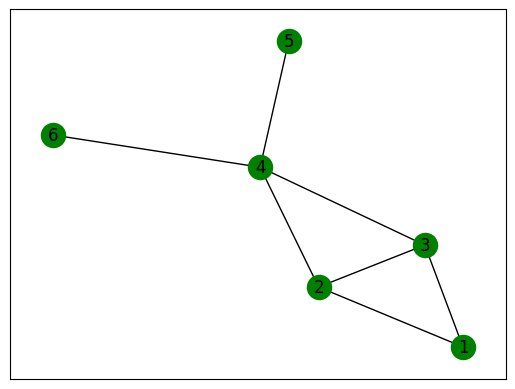

In [34]:
import networkx as nx

G = nx.Graph()
G.add_edges_from([(1, 2), (1, 3), (2, 3), (2, 4), (3, 4), (4, 5), (4, 6)])
node_clustering = nx.clustering(G)
print("Node Clustering Coefficients:")
node_clustering.
for node, clustering_coefficient in node_clustering.items():
   print(f"Node {node}: {clustering_coefficient}")
nx.draw_networkx(G, with_labels = True, node_color ='green')

In [116]:
from tqdm import tqdm
import networkx as nx

graph = nx.Graph()
for (first_name, first_weighted) in tqdm(graphs):
    for (second_name, second_weighted) in graphs:
        if (first_name == second_name):
            continue
        graph.add_edge(first_name, second_name, weight=get_normalized_value_similarity(first_weighted, second_weighted))

 33%|███▎      | 793/2430 [8:53:27<18:21:12, 40.36s/it]


KeyboardInterrupt: 

In [121]:
import matplotlib.pyplot as plt

fig = plt.figure(1, figsize=(200, 80), dpi=60)
nx.draw(graph, with_labels=True, font_weight='normal')

In [1]:
import os
from collections import defaultdict 

category_to_name = defaultdict(list)
name_to_nickname = dict()
for name in os.listdir('gr_elib'):
    category = name.split('-')[0]
    category_to_name[category].append(name)
    name_to_nickname[name] = category[:5] + '-' + str(len(category_to_name[category]))

In [8]:
import pandas as pd
from tqdm import tqdm
import networkx as nx

def get_part_graph(from_i, to_i):
    first_names =  [item for sublist in [pair[1] for pair in list(category_to_name.items())[from_i:to_i]] for item in sublist]
    graphs = [(name, pd.read_csv('gr_elib/' + name)) for name in first_names]
    little_graph = nx.Graph()

    for (first_name, first_weighted) in tqdm(graphs):
        for (second_name, second_weighted) in graphs:
            if (first_name == second_name):
                continue
            little_graph.add_edge(first_name, second_name, weight=get_normalized_value_similarity(first_weighted, second_weighted))
    return little_graph

In [9]:
little_graph = get_part_graph(0, 5)

100%|██████████| 166/166 [11:25<00:00,  4.13s/it]


In [10]:
colors = ["tab:red", "tab:orange", "tab:olive", "tab:green", "tab:blue"]
category_to_color = dict()
color_map = []

i = 0
for node in little_graph:
    category = node.split('-')[0]
    
    if category not in category_to_color:
        category_to_color[category] = colors[i]
        i += 1
    color_map.append(category_to_color[category])

In [11]:
category_to_color

{'Автоматика. Вычислительная техника': 'tab:red',
 'Астрономия': 'tab:orange',
 'Биология': 'tab:olive',
 'Биотехнология': 'tab:green',
 'Внешняя торговля': 'tab:blue'}

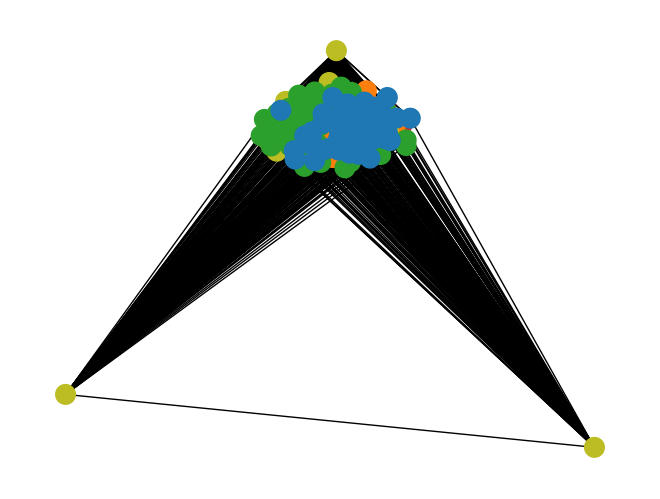

In [12]:
nx.draw(little_graph, node_size=200, node_color=color_map)

In [14]:
from node2vec import Node2Vec

node2vec = Node2Vec(little_graph, dimensions=64, walk_length=30, num_walks=200, workers=1)
model = node2vec.fit(window=10, min_count=1)

Computing transition probabilities:   0%|          | 0/166 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 200/200 [01:34<00:00,  2.13it/s]


In [15]:
node_embeddings = {node: model.wv[node] for node in little_graph.nodes()}

In [16]:
import numpy as np
from sklearn.cluster import KMeans

X = np.array([node_embeddings[node] for node in little_graph.nodes()])
kmeans = KMeans(n_clusters=5, random_state=0).fit(X)

c:\Users\Alexandra\Desktop\TextsGraphCompare\env\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [23]:
tr = {'Автоматика. Вычислительная техника': 3,
 'Астрономия': 0,
 'Биология': 2,
 'Биотехнология': 1,
 'Внешняя торговля': 4}
categories = [tr[node.split('-')[0]] for node in little_graph.nodes()]
np.array(categories)

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4])

In [17]:
kmeans.labels_

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 0, 3, 3, 3, 3, 3, 3, 0, 3, 3, 0, 0, 1, 1, 1, 1, 0, 3, 3, 3,
       1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 2, 2, 1, 3, 2, 3, 3, 3,
       2, 2, 3, 3, 3, 2, 3, 2, 2, 2, 2, 3, 3, 3, 2, 2, 3, 2, 1, 1, 0, 0,
       0, 3, 0, 0, 0, 0, 0, 1, 4, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4])

In [24]:
kmeans.labels_ == np.array(categories)

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True,  True,  True,  True, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True,  True,
       False, False, False, False, False, False, False, False, False,
       False,  True, False,  True,  True,  True,  True,  True,  True,
        True,  True,

In [13]:
test_graph = get_part_graph(5, 8)

100%|██████████| 131/131 [08:49<00:00,  4.05s/it]


In [ ]:
node2vec_t = Node2Vec(test_graph, dimensions=64, walk_length=30, num_walks=200, workers=1)
model_t = node2vec_t.fit(window=10, min_count=1)
node_embeddings_t = {node: model.wv[node] for node in test_graph.nodes()}
X_t = np.array([node_embeddings[node] for node in test_graph.nodes()])
pred = kmeans.predict(X_t)
pred